In [18]:
import numpy as np
import matplotlib.pyplot as plt
import tensorly as tl
from tensorly.decomposition import parafac
import torch

In [125]:
t = torch.load('/scratch2/mrenaudin/colorlessgreenRNNs/checkpoints/lstm_adam_full_check/weights/layer1_cell_gate_hh_first100batches.pt', map_location='cpu')

In [126]:
t[20]

tensor([[ 0.0412, -0.0220,  0.0476,  ..., -0.0028, -0.0038, -0.0059],
        [ 0.0049,  0.0205,  0.0206,  ..., -0.0054, -0.0382,  0.0361],
        [ 0.0346, -0.0443,  0.0096,  ..., -0.0171,  0.0048,  0.0008],
        ...,
        [-0.0199, -0.0183,  0.0200,  ...,  0.0042,  0.0176, -0.0286],
        [ 0.0082,  0.0109,  0.0322,  ..., -0.0386, -0.0112, -0.0291],
        [ 0.0018,  0.0362, -0.0050,  ...,  0.0378,  0.0091,  0.0182]])

In [127]:
array = np.array(t)

In [128]:
factors = parafac(array, rank=1, n_iter_max=10000, tol=1e-6)

In [129]:
len(factors.factors)

3

In [130]:
factors.factors[0]

array([[-0.45745018],
       [-0.7810599 ],
       [-1.1819024 ],
       [-1.5776994 ],
       [-2.0351942 ],
       [-2.4161012 ],
       [-2.7472212 ],
       [-3.0391161 ],
       [-3.298913  ],
       [-3.530937  ],
       [-3.738795  ],
       [-3.925241  ],
       [-4.0928392 ],
       [-4.243786  ],
       [-4.380084  ],
       [-4.5037074 ],
       [-4.616156  ],
       [-4.7186985 ],
       [-4.812159  ],
       [-4.8969617 ],
       [-4.973794  ],
       [-5.043222  ],
       [-5.106143  ],
       [-5.1636233 ],
       [-5.2163763 ],
       [-5.265031  ],
       [-5.310098  ],
       [-5.3518662 ],
       [-5.3904557 ],
       [-5.4254217 ],
       [-5.4569726 ],
       [-5.485535  ],
       [-5.5117307 ],
       [-5.536725  ],
       [-5.560546  ],
       [-5.5826163 ],
       [-5.6029696 ],
       [-5.6213813 ],
       [-5.638558  ],
       [-5.6539125 ],
       [-5.6674166 ],
       [-5.67979   ],
       [-5.690283  ],
       [-5.699398  ],
       [-5.706807  ],
       [-5

In [131]:
outer = np.outer(factors.factors[1][:,0], factors.factors[2][:,0])

In [132]:
outer.shape

(650, 650)

In [133]:
tt_1 = outer*(factors.factors[0][0])
tt_2 = outer*(factors.factors[0][20])
tt_3 = outer*(factors.factors[0][39])


In [134]:
import plotly.express as px
fig = px.imshow(tt_3, color_continuous_scale=px.colors.sequential.Cividis_r)
fig.show()

In [135]:
fig = px.imshow((np.abs(tt_1-tt_3)-np.abs(tt_1-tt_2)), color_continuous_scale=px.colors.sequential.Cividis_r)
fig.show()

=== Step by Step Analysis ===


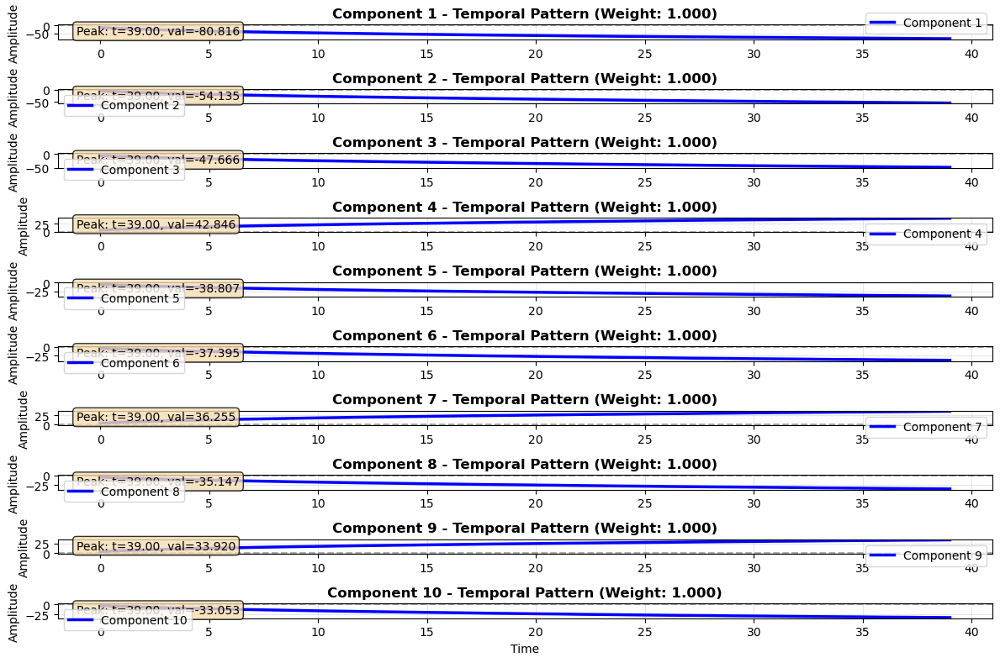

=== PARAFAC Explained Variance Analysis ===
Explained Variance Ratio: 0.1825 (18.25%)
RMSE: 0.341132
Relative Error: 0.904134
Total Sum of Squares: 2.41e+06
Explained Sum of Squares: 4.39e+05
Residual Sum of Squares: 1.97e+06

Component Contributions:
  Component 1: 0.1000 (10.00%)
  Component 2: 0.1000 (10.00%)
  Component 3: 0.1000 (10.00%)
  Component 4: 0.1000 (10.00%)
  Component 5: 0.1000 (10.00%)
  Component 6: 0.1000 (10.00%)
  Component 7: 0.1000 (10.00%)
  Component 8: 0.1000 (10.00%)
  Component 9: 0.1000 (10.00%)
  Component 10: 0.1000 (10.00%)

=== Comprehensive Analysis ===
=== PARAFAC Analysis (Rank=3) ===
Tensor shape: torch.Size([40, 650, 650])
Converted PyTorch tensor to NumPy
Running PARAFAC decomposition...
PARAFAC completed!
=== PARAFAC Explained Variance Analysis ===
Explained Variance Ratio: 0.1028 (10.28%)
RMSE: 0.357381
Relative Error: 0.947199
Total Sum of Squares: 2.41e+06
Explained Sum of Squares: 2.47e+05
Residual Sum of Squares: 2.16e+06

Component Contrib

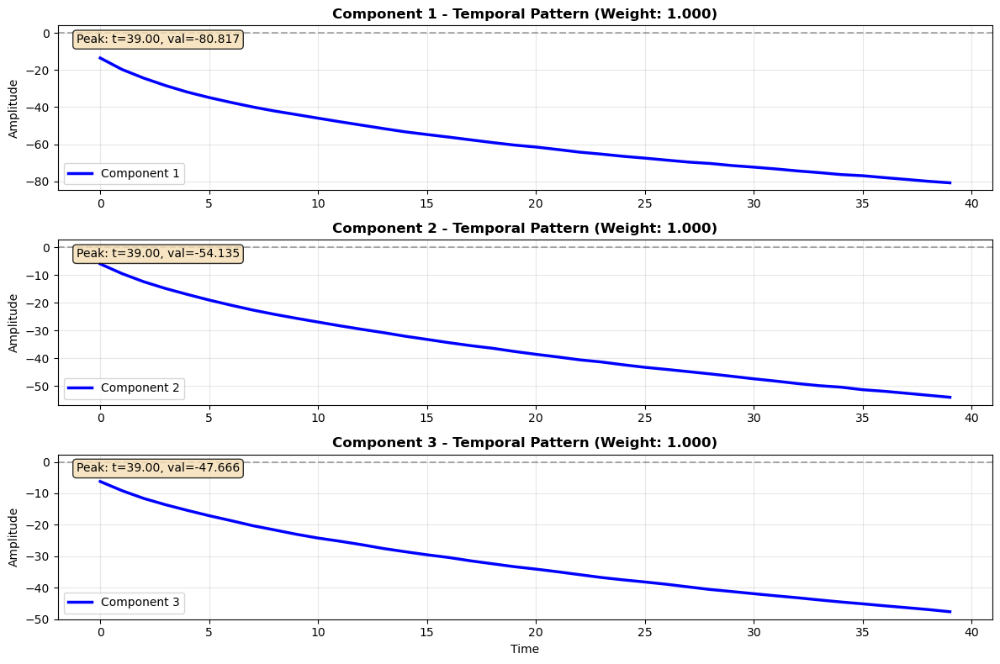

Plotting reconstruction quality...


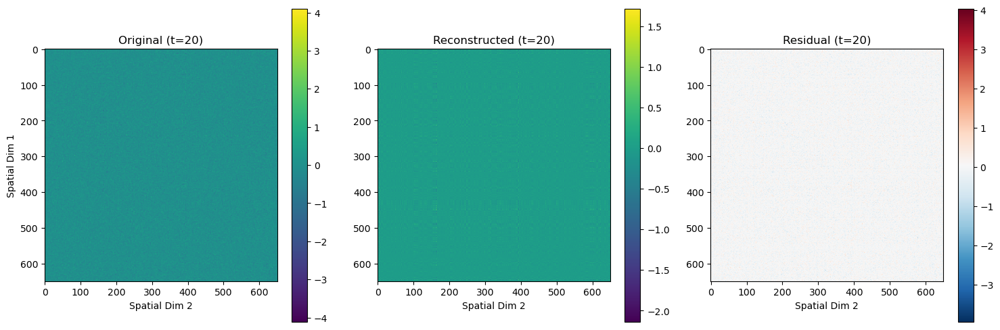


Final explained variance: 0.1028


In [56]:
import numpy as np
import matplotlib.pyplot as plt
import tensorly as tl
from tensorly.decomposition import parafac
import torch

def plot_temporal_factors(factors, time_axis=None, figsize=(12, 8), save_path=None):
    """
    Plot temporal factors from PARAFAC decomposition
    
    Parameters:
    -----------
    factors : tuple
        PARAFAC factors from tensorly (weights, [temporal, spatial1, spatial2])
    time_axis : array-like, optional
        Time points for x-axis. If None, uses indices
    figsize : tuple
        Figure size (width, height)
    save_path : str, optional
        Path to save the plot
    
    Returns:
    --------
    fig, axes : matplotlib objects
    """
    
    # Extract temporal factors (first mode)
    temporal_factors = factors[1][0]  # Shape: [time_points, n_components]
    weights = factors[0]  # Component weights
    
    n_time_points, n_components = temporal_factors.shape
    
    # Create time axis if not provided
    if time_axis is None:
        time_axis = np.arange(n_time_points)
    
    # Create subplots
    fig, axes = plt.subplots(n_components, 1, figsize=figsize, squeeze=False)
    axes = axes.flatten()
    
    # Plot each temporal component
    for i in range(n_components):
        ax = axes[i]
        
        # Plot temporal factor
        temporal_pattern = temporal_factors[:, i]
        ax.plot(time_axis, temporal_pattern, 'b-', linewidth=2.5, 
                label=f'Component {i+1}')
        
        # Add zero line
        ax.axhline(y=0, color='k', linestyle='--', alpha=0.3)
        
        # Formatting
        ax.set_title(f'Component {i+1} - Temporal Pattern (Weight: {weights[i]:.3f})', 
                    fontsize=12, fontweight='bold')
        ax.set_xlabel('Time' if i == n_components-1 else '')
        ax.set_ylabel('Amplitude')
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # Add statistics
        peak_idx = np.argmax(np.abs(temporal_pattern))
        peak_time = time_axis[peak_idx]
        peak_value = temporal_pattern[peak_idx]
        
        ax.text(0.02, 0.95, f'Peak: t={peak_time:.2f}, val={peak_value:.3f}', 
                transform=ax.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()
    
    return fig, axes

def reconstruct_tensor_manual(factors):
    """
    Manually reconstruct tensor from PARAFAC factors
    """
    weights, factor_matrices = factors
    
    # Get dimensions
    n_components = len(weights)
    tensor_shape = [f.shape[0] for f in factor_matrices]
    
    # Initialize reconstructed tensor
    reconstructed = np.zeros(tensor_shape)
    
    # Sum over all components
    for r in range(n_components):
        # Create rank-1 tensor for component r
        component_tensor = weights[r]
        for mode, factor_matrix in enumerate(factor_matrices):
            component_tensor = np.multiply.outer(component_tensor, factor_matrix[:, r])
        
        reconstructed += component_tensor
    
    return reconstructed

def compute_explained_variance(original_tensor, factors, verbose=True):
    """
    Compute explained variance from PARAFAC decomposition
    
    Parameters:
    -----------
    original_tensor : ndarray
        Original tensor data
    factors : tuple
        PARAFAC factors from tensorly
    verbose : bool
        Print detailed results
        
    Returns:
    --------
    dict : Dictionary with variance metrics
    """
    
    # Reconstruct tensor from factors - try multiple methods
    try:
        # Method 1: Try kruskal_to_tensor
        reconstructed_tensor = tl.kruskal_to_tensor(factors)
    except AttributeError:
        try:
            # Method 2: Try cp_to_tensor (newer TensorLy versions)
            from tensorly import cp_to_tensor
            reconstructed_tensor = cp_to_tensor(factors)
        except (ImportError, AttributeError):
            # Method 3: Manual reconstruction
            reconstructed_tensor = reconstruct_tensor_manual(factors)
    
    # Compute residuals
    residual = original_tensor - reconstructed_tensor
    
    # Calculate sum of squares
    ss_total = np.sum(original_tensor**2)
    ss_residual = np.sum(residual**2)
    ss_explained = ss_total - ss_residual
    
    # Explained variance ratio
    explained_variance_ratio = ss_explained / ss_total
    
    # Root mean square error
    rmse = np.sqrt(np.mean(residual**2))
    
    # Relative error
    relative_error = np.linalg.norm(residual) / np.linalg.norm(original_tensor)
    
    # Per-component explained variance
    weights = factors[0]
    component_contributions = weights**2 / np.sum(weights**2)
    
    results = {
        'explained_variance_ratio': explained_variance_ratio,
        'rmse': rmse,
        'relative_error': relative_error,
        'ss_total': ss_total,
        'ss_explained': ss_explained,
        'ss_residual': ss_residual,
        'component_contributions': component_contributions,
        'reconstructed_tensor': reconstructed_tensor,
        'residual': residual
    }
    
    if verbose:
        print("=== PARAFAC Explained Variance Analysis ===")
        print(f"Explained Variance Ratio: {explained_variance_ratio:.4f} ({explained_variance_ratio*100:.2f}%)")
        print(f"RMSE: {rmse:.6f}")
        print(f"Relative Error: {relative_error:.6f}")
        print(f"Total Sum of Squares: {ss_total:.2e}")
        print(f"Explained Sum of Squares: {ss_explained:.2e}")
        print(f"Residual Sum of Squares: {ss_residual:.2e}")
        print("\nComponent Contributions:")
        for i, contrib in enumerate(component_contributions):
            print(f"  Component {i+1}: {contrib:.4f} ({contrib*100:.2f}%)")
    
    return results

def plot_reconstruction_quality(original_tensor, factors, slice_idx=None, figsize=(15, 5)):
    """
    Plot original vs reconstructed tensor slices to assess quality
    
    Parameters:
    -----------
    original_tensor : ndarray
        Original tensor [time, spatial1, spatial2]
    factors : tuple
        PARAFAC factors
    slice_idx : int, optional
        Time slice to plot. If None, uses middle slice
    figsize : tuple
        Figure size
    """
    
    # Reconstruct tensor - try multiple methods
    try:
        reconstructed = tl.kruskal_to_tensor(factors)
    except AttributeError:
        try:
            from tensorly import cp_to_tensor
            reconstructed = cp_to_tensor(factors)
        except (ImportError, AttributeError):
            reconstructed = reconstruct_tensor_manual(factors)
    residual = original_tensor - reconstructed
    
    # Select slice
    if slice_idx is None:
        slice_idx = original_tensor.shape[0] // 2
    
    # Plot
    fig, axes = plt.subplots(1, 3, figsize=figsize)
    
    # Original
    im1 = axes[0].imshow(original_tensor[slice_idx], cmap='viridis')
    axes[0].set_title(f'Original (t={slice_idx})')
    axes[0].set_xlabel('Spatial Dim 2')
    axes[0].set_ylabel('Spatial Dim 1')
    plt.colorbar(im1, ax=axes[0])
    
    # Reconstructed
    im2 = axes[1].imshow(reconstructed[slice_idx], cmap='viridis')
    axes[1].set_title(f'Reconstructed (t={slice_idx})')
    axes[1].set_xlabel('Spatial Dim 2')
    plt.colorbar(im2, ax=axes[1])
    
    # Residual
    im3 = axes[2].imshow(residual[slice_idx], cmap='RdBu_r')
    axes[2].set_title(f'Residual (t={slice_idx})')
    axes[2].set_xlabel('Spatial Dim 2')
    plt.colorbar(im3, ax=axes[2])
    
    plt.tight_layout()
    plt.show()
    
    return fig, axes

def comprehensive_parafac_analysis(tensor, rank=3, time_axis=None, max_iter=1000, tol=1e-3):
    """
    Complete PARAFAC analysis pipeline
    
    Parameters:
    -----------
    tensor : torch.Tensor or ndarray
        Input tensor [time, spatial1, spatial2]
    rank : int
        Number of components
    time_axis : array-like, optional
        Time points
    max_iter : int
        Maximum iterations
    tol : float
        Convergence tolerance
        
    Returns:
    --------
    dict : Complete analysis results
    """
    
    print(f"=== PARAFAC Analysis (Rank={rank}) ===")
    print(f"Tensor shape: {tensor.shape}")
    
    # Convert PyTorch to NumPy if needed
    if isinstance(tensor, torch.Tensor):
        if tensor.requires_grad:
            tensor_np = tensor.detach().cpu().numpy()
        else:
            tensor_np = tensor.cpu().numpy()
        print("Converted PyTorch tensor to NumPy")
    else:
        tensor_np = tensor
    
    # Apply PARAFAC
    print("Running PARAFAC decomposition...")
    factors = parafac(tensor_np, rank=rank, n_iter_max=max_iter, tol=tol)
    print("PARAFAC completed!")
    
    # Compute explained variance
    variance_results = compute_explained_variance(tensor_np, factors)
    
    # Plot temporal factors
    print("\nPlotting temporal factors...")
    fig_temporal, axes_temporal = plot_temporal_factors(factors, time_axis)
    
    # Plot reconstruction quality
    print("Plotting reconstruction quality...")
    fig_recon, axes_recon = plot_reconstruction_quality(tensor_np, factors)
    
    # Return complete results
    results = {
        'factors': factors,
        'variance_analysis': variance_results,
        'temporal_plot': (fig_temporal, axes_temporal),
        'reconstruction_plot': (fig_recon, axes_recon),
        'tensor_shape': tensor.shape,
        'rank': rank
    }
    
    return results

# Example usage function
def example_usage():
    """
    Example of how to use these functions with your tensor
    """
    # Assuming you have your tensor 't' with shape [40, 650, 650]
    # t = your_tensor_here
    
    # Create dummy data for demonstration
    
    
    # Method 1: Step by step
    print("=== Step by Step Analysis ===")
    
    # Convert and decompose
    factors = parafac(array, rank=10, n_iter_max=1000, tol=1e-3)
    
    # Plot temporal factors
    time_points = np.arange(40)  # or your actual time axis
    plot_temporal_factors(factors, time_axis=time_points)
    
    # Compute explained variance
    variance_results = compute_explained_variance(array, factors)
    
    # Method 2: All-in-one analysis
    print("\n=== Comprehensive Analysis ===")
    results = comprehensive_parafac_analysis(t, rank=3, time_axis=time_points)
    
    # Access results
    explained_var = results['variance_analysis']['explained_variance_ratio']
    print(f"\nFinal explained variance: {explained_var:.4f}")
    
    return results

if __name__ == "__main__":
    # Run example
    results = example_usage()